In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [50]:
features = pd.read_csv('features_Before_prepro_week4.csv')
train_temp = pd.read_csv('kotra_train.csv')
test_temp = pd.read_csv('kotra_test.csv')

<font color='CC3D3D'>

# Ch.3 Preprocessing


<font color='green'>

### 다중공선성 제거

In [51]:
import collections
tmp_train = pd.read_csv('new_traintest.csv')

In [52]:
except_onehot_features = collections.Counter(features.columns.tolist()) \
    - collections.Counter([str(num) for num in pd.get_dummies(tmp_train.HSCD).columns.tolist()]) \
    - collections.Counter(pd.get_dummies(tmp_train.COUNTRYNM).columns.tolist()) \
    - collections.Counter(pd.get_dummies(tmp_train.CONTINENT).columns.tolist()) \
    - collections.Counter(pd.get_dummies(tmp_train.HSCD_name).columns.tolist()) \
    - collections.Counter(['HongKong'])


plot_features = [k for k in except_onehot_features.keys()]
print(len(plot_features))

188


In [53]:
basic_features = features[plot_features].loc[:, :'PPP_TREND']
country_features = features[plot_features].loc[:, 'HSCD_COUNTRYCD_CV_2013':'HSCD_name_pur_variance']
continent_features = features[plot_features].loc[:, 'HSCD_COUNTRYCD_CV_2013_ctn':'TRADE_HSCD_COUNTRYCD_InDecrease_1716_ctn']
main_product_features = features[plot_features].loc[:, 'import_export_ko_ratio_2013':'import_export_ko_ratio_NEW_2017']
product_features = features[plot_features].loc[:, 'TRADE_COUNTRYCD_CV_2013':'TRADE_HSCD_COUNTRYCD_InDecrease_1617']

####  기본 피쳐에 대한 상관관계

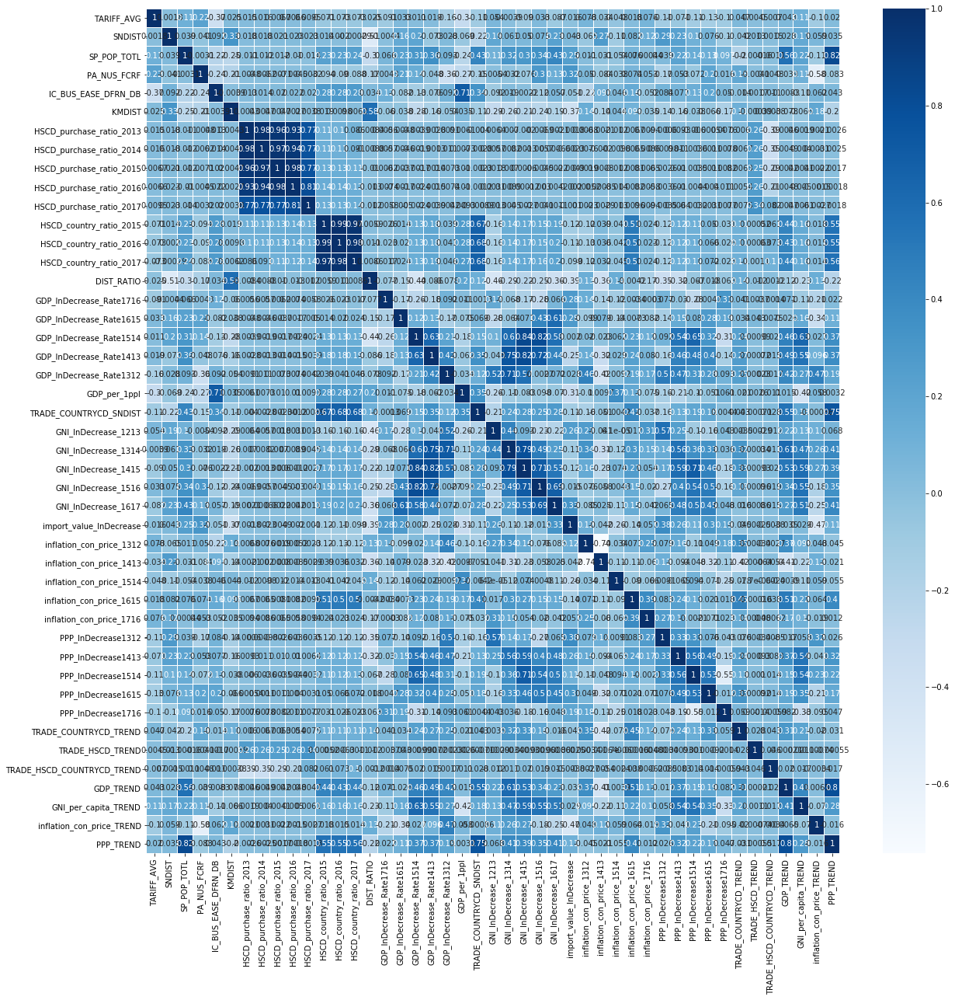

In [54]:
plt.figure(figsize=(20, 20))
sns.heatmap(basic_features.corr(), annot=True, cmap='Blues', linewidths=0.01)
plt.show()

#### 국가별 피쳐에 대한 상관관계

In [55]:
drop_lst = ['HSCD_BS220_ratio_2013', 'HSCD_BS220_ratio_2014', 'HSCD_BS220_ratio_2015', 'HSCD_BS220_ratio_2016', 'HSCD_BS220_ratio_2017',
           'HSCD_COUNTRYCD_MAX_2017']
print('drop_lst: ', len(drop_lst))

country_features = country_features.drop(drop_lst, axis=1)

drop_lst:  6


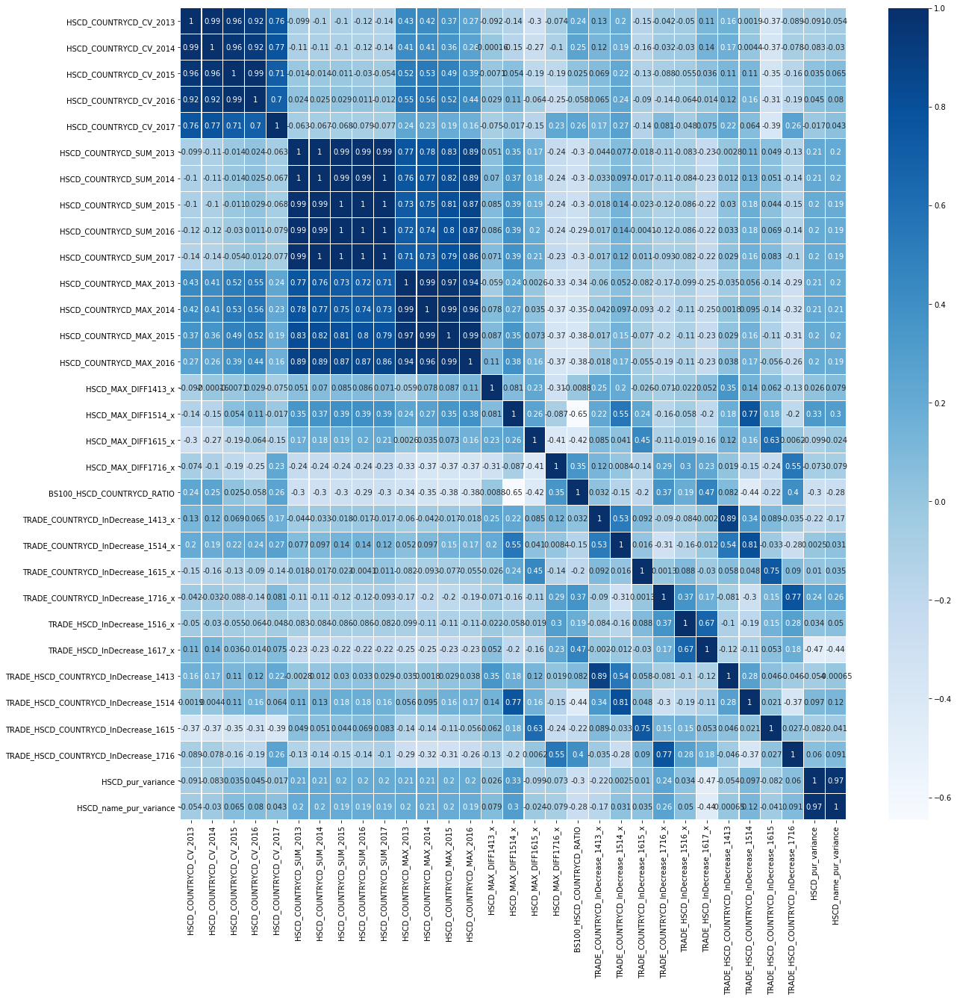

In [56]:
plt.figure(figsize=(20, 20))
sns.heatmap(country_features.corr(), annot=True, cmap='Blues', linewidths=0.01)
plt.show()

####  대륙별 피쳐에 대한 상관관계

In [57]:
drop_lst = ['HSCD_BS220_ratio_2013_ctn', 'HSCD_BS220_ratio_2014_ctn', 'HSCD_BS220_ratio_2015_ctn', 'HSCD_BS220_ratio_2016_ctn', 'HSCD_BS220_ratio_2017_ctn',
            'HSCD_COUNTRYCD_MAX_2017_ctn', 'HSCD_MAX_DIFF_ctn1716', 'TRADE_HSCD_COUNTRYCD_InDecrease_1514_ctn'
           ]
print('drop_lst: ', len(drop_lst))

continent_features = continent_features.drop(drop_lst, axis=1)

drop_lst:  8


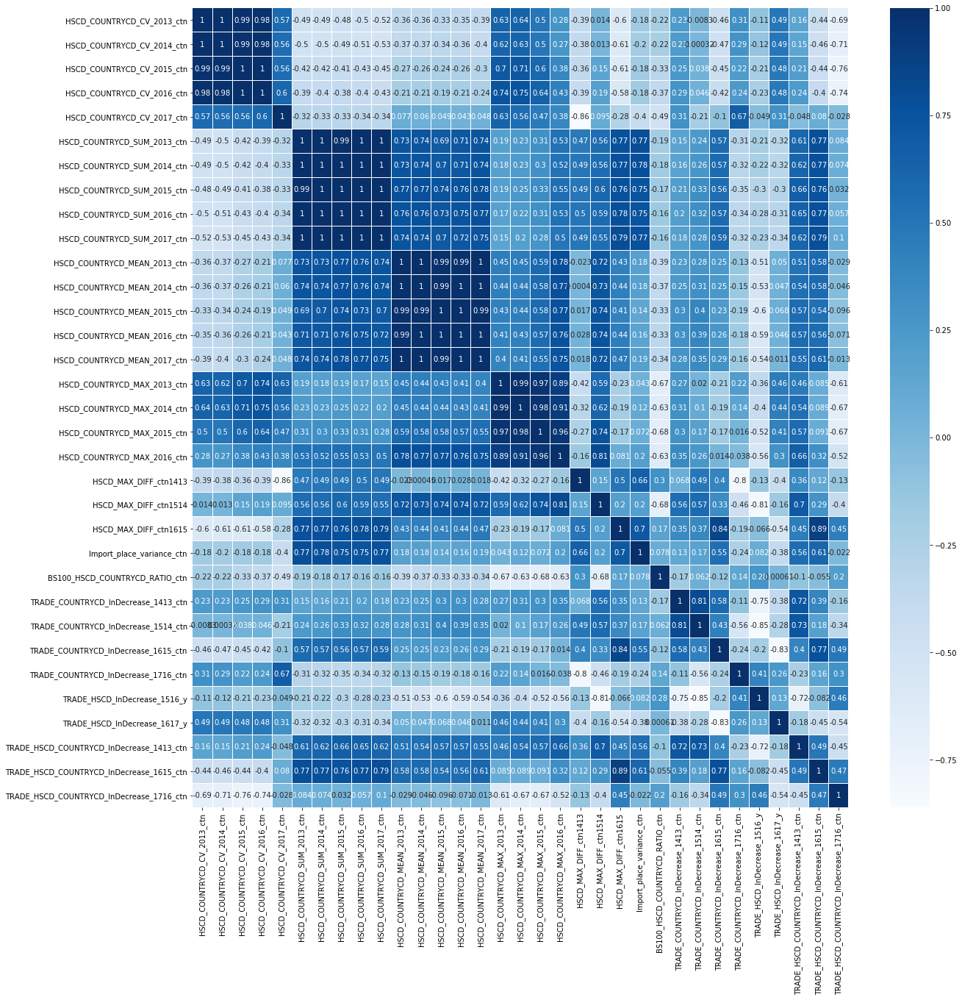

In [58]:
plt.figure(figsize=(20, 20))
sns.heatmap(continent_features.corr(), annot=True, cmap='Blues', linewidths=0.01)
plt.show()

####  품목별 피쳐에 대한 상관관계

In [59]:
drop_lst = ['HSCD_name_SUM_2013','HSCD_name_SUM_2014','HSCD_name_SUM_2015','HSCD_name_SUM_2016','HSCD_name_SUM_2017',
           ]
print('drop_lst: ', len(drop_lst))

product_features = product_features.drop(drop_lst, axis=1)

drop_lst:  5


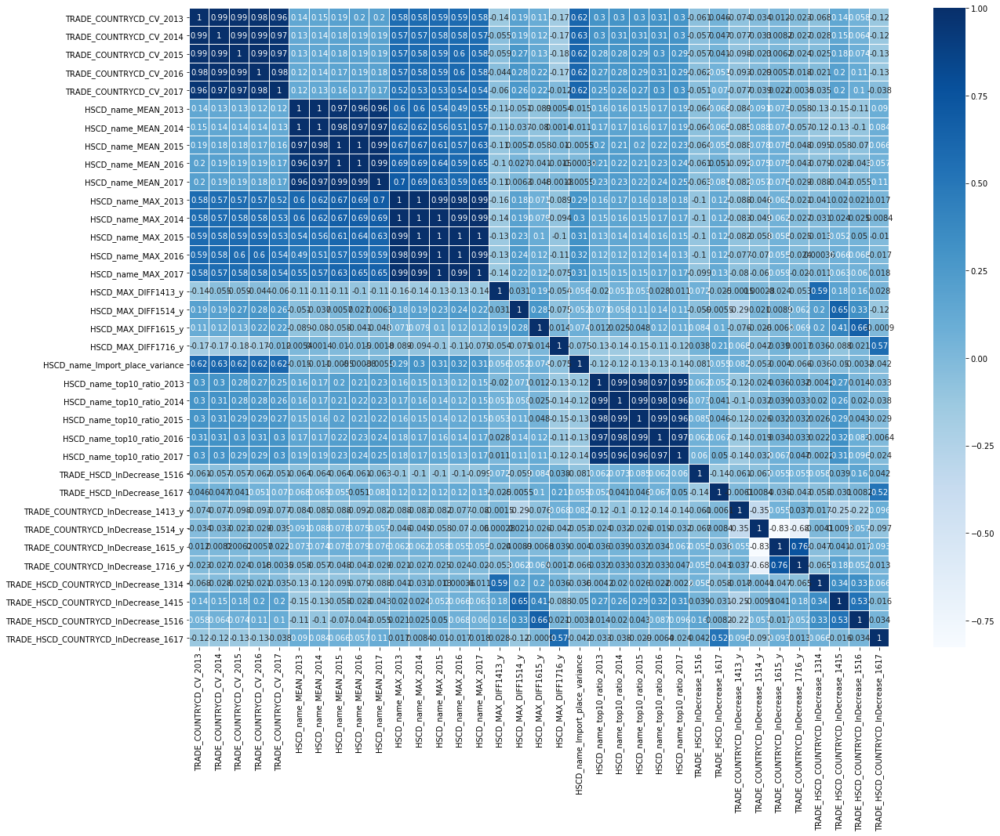

In [60]:
plt.figure(figsize=(20, 15))
sns.heatmap(product_features.corr(), annot=True, cmap='Blues', linewidths=0.01)
plt.show()

####  주요품목별 피쳐에 대한 상관관계

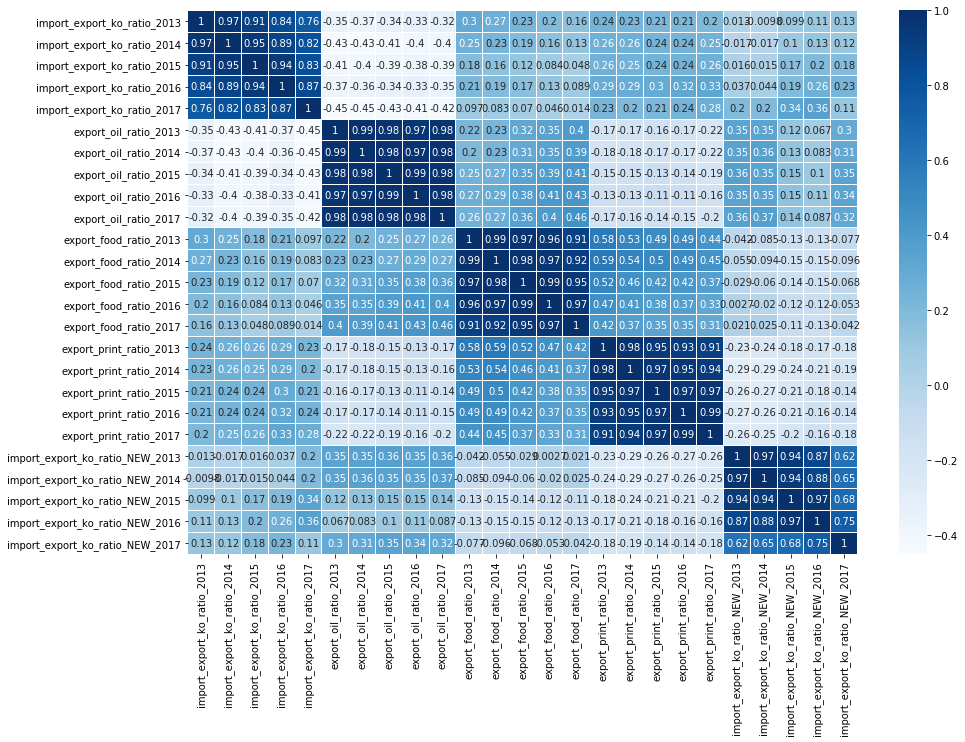

In [61]:
plt.figure(figsize=(15, 10))
sns.heatmap(main_product_features.corr(), annot=True, cmap='Blues', linewidths=0.01)
plt.show()

#### 마지막으로 모두 합쳐서 살펴본다
 - 모든 numeric 피쳐들의 상관관계를 살펴보고 다른 종류의 피쳐끼리 0.9이상의 상관관계를 가지는 피쳐들을 모두 제거하여 다중공선성의 가능성을 없애도록 하였음

In [62]:
numeric_features = pd.concat([basic_features, country_features, continent_features, product_features, main_product_features], axis=1)

In [74]:
drop_lst = ['HSCD_COUNTRYCD_SUM_2013', 'HSCD_COUNTRYCD_SUM_2014', 
           ]
print('drop_lst: ', len(drop_lst))

numeric_features = numeric_features.drop(drop_lst, axis=1)

drop_lst:  2


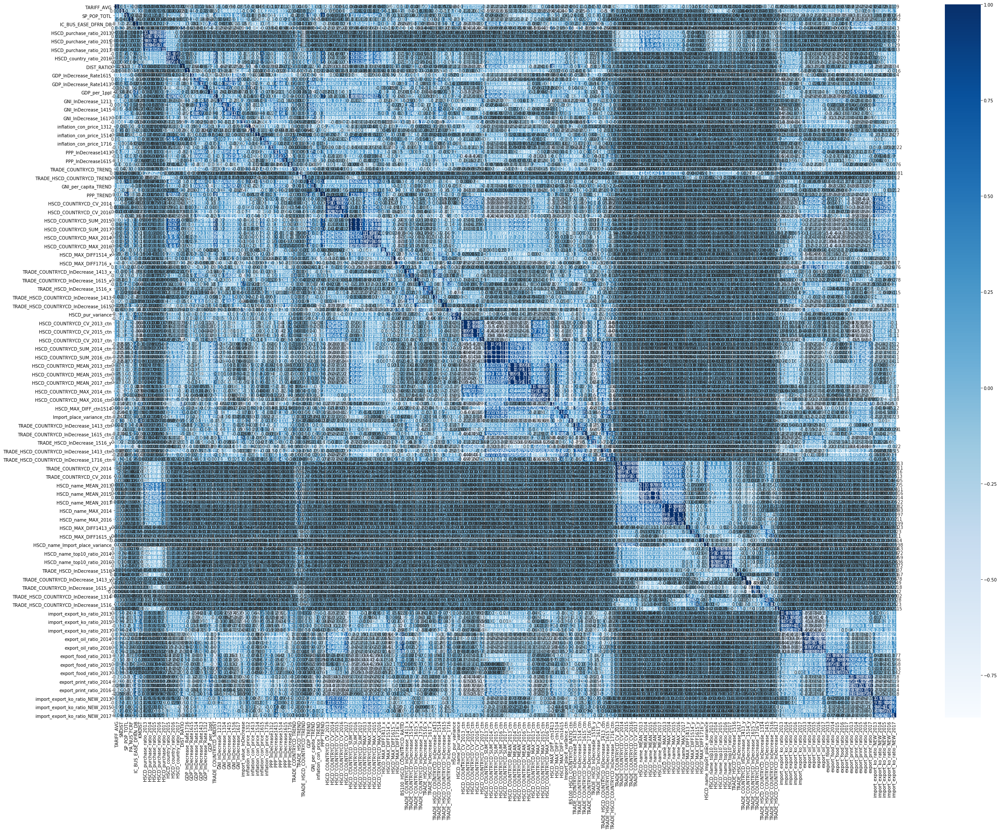

In [75]:
plt.figure(figsize=(40, 30))
sns.heatmap(numeric_features.corr(), annot=True, cmap='Blues', linewidths=0.001)
plt.show()

In [76]:
print(numeric_features.shape)

(42378, 167)


<font color='green'>

### 주성분 분석

In [77]:
from sklearn.decomposition import PCA

In [78]:
# 1. HSCD
HSCD_lst = [str(num) for num in pd.get_dummies(tmp_train.HSCD).columns.tolist()]
# 2. HSCD_name
HSCD_name_lst = pd.get_dummies(tmp_train.HSCD_name).columns.tolist()
# 3. COUNTRYNM
COUNTRYNM_lst = pd.get_dummies(tmp_train.COUNTRYNM).columns.tolist()
COUNTRYNM_lst[8] = 'HongKong'
# 4. CONTINENT
CONTINENT_lst = pd.get_dummies(tmp_train.CONTINENT).columns.tolist()

# OHE_lst = OHE_features
OHE_lst = HSCD_lst + HSCD_name_lst + COUNTRYNM_lst + CONTINENT_lst

OHE_features = features[OHE_lst]
OHE_features_train = OHE_features.iloc[:21189]
OHE_features_test = OHE_features.iloc[21189:]

In [79]:
OHE_pca = PCA(n_components=0.9, random_state=42).fit(OHE_features_train)
pca_train = OHE_pca.transform(OHE_features_train)
pca_test = OHE_pca.transform(OHE_features_test)
pca_column_names = [f'pca_{num}' for num in range(pca_train.shape[1])]

OHE_features = pd.concat([pd.DataFrame(pca_train, columns=pca_column_names),
                          pd.DataFrame(pca_test, columns=pca_column_names)], ignore_index=True)

print(OHE_features.shape)

(42378, 351)


<font color='green'>

### 이상치 탐색

In [85]:
features = pd.concat([numeric_features, OHE_features], axis=1)
features.replace(np.inf, 0, inplace=True)
features_train = features.iloc[:21189, :]
features_test = features.iloc[21189:, :]

In [86]:
numeric_features.shape

(42378, 167)

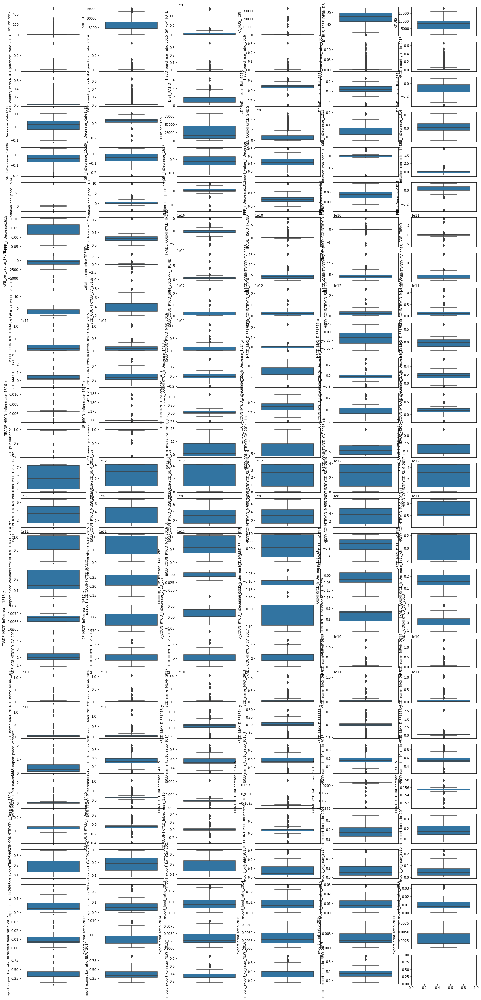

In [88]:
train_columns = numeric_features.columns.tolist()

fig, axes = plt.subplots(28, 6, figsize=(25, 55))
for num, column in enumerate(train_columns):
    row = num // 6
    col = num % 6
    sns.boxplot(y = numeric_features[column], ax=axes[row][col])
plt.show() 

In [89]:
# TARIFF_AVG에 대해서 이상치가 보이므로 확인하여 보도록 한다.
display(train_temp[train_temp.TARIFF_AVG > 250])

,UNC_YEAR,HSCD,COUNTRYCD,COUNTRYNM,TRADE_COUNTRYCD,TRADE_HSCD,TARIFF_AVG,SNDIST,NY_GDP_MKTP_CD,NY_GDP_MKTP_CD_1Y,SP_POP_TOTL,PA_NUS_FCRF,IC_BUS_EASE_DFRN_DB,KMDIST,TRADE_HSCD_COUNTRYCD
506,2017,210690,818,Egypt,66338749061,35193159486,254.2,4901.797114,235733695652,332441717791,96442593,17.782534,55.47428,8497.368164,170328514.0
10751,2017,870829,144,Sri Lanka,21316172076,72567468243,515.0,6639.906208,87428125558,82401038710,21444000,152.446414,59.82373,5840.512695,8697144.0
18817,2017,841590,144,Sri Lanka,21316172076,17188916527,312.0,6071.049656,87428125558,82401038710,21444000,152.446414,59.82373,5840.512695,10332341.0


**아래와 같이 이상치에 대해서 18년도와 비교하여 보니 크게 다르지 않아서 해당 수치를 이상치로 간주하지 않고 가져가도록 한다.**

In [90]:
idx_lst = [506, 10751, 18817]

for idx in idx_lst:
    print('## index ## ', idx)
    display(train_temp.iloc[idx, [3, 6]])
    display(test_temp.iloc[idx, [3, 6]])

## index ##  506


COUNTRYNM     Egypt
TARIFF_AVG    254.2
Name: 506, dtype: object

COUNTRYNM     Egypt
TARIFF_AVG    221.7
Name: 506, dtype: object

## index ##  10751


COUNTRYNM     Sri Lanka
TARIFF_AVG        515.0
Name: 10751, dtype: object

COUNTRYNM     Sri Lanka
TARIFF_AVG        504.9
Name: 10751, dtype: object

## index ##  18817


COUNTRYNM     Sri Lanka
TARIFF_AVG        312.0
Name: 18817, dtype: object

COUNTRYNM     Sri Lanka
TARIFF_AVG        303.9
Name: 18817, dtype: object

<font color='green'>

### 스케일링
    
 - 1. RobustScaler

중앙값(median)과 IQR(interquartile range) 사용하여  
아웃라이어의 영향을 최소화하는 Robust Scaler를 사용함

#### RobustScaler

In [93]:
from sklearn.preprocessing import RobustScaler 

In [94]:
scaler = RobustScaler().fit(features_train)
scaled_train = pd.DataFrame(scaler.transform(features_train), columns=features.columns.tolist())
scaled_test = pd.DataFrame(scaler.transform(features_test), columns=features.columns.tolist())

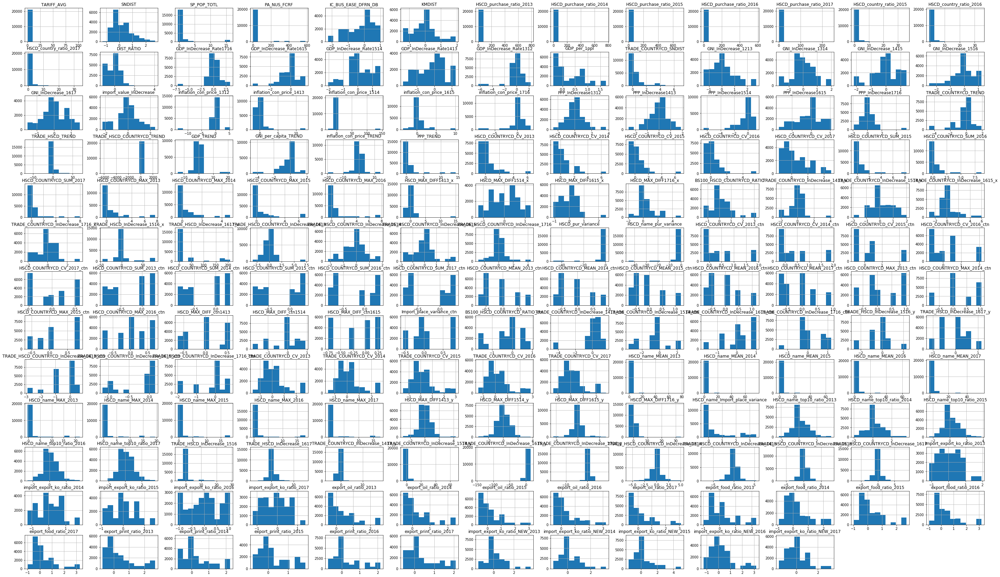

In [95]:
# OHE 피쳐들을 제외한 numeric 피쳐들의 분포도를 살펴본다
scaled_train.iloc[:, :167].hist(figsize=(50, 30))
plt.show()

<font color='green'>
    
 - 2. 로그화
    
로그함수는 0에 가까운 값들이 조밀하게 모여있는 입력값을 넓은 범위로 펼칠 수 있는 동시에  
큰 값들에 대해서는 값이 크게 차이나지 않게 해주므로 이런 특성을 갖는 로그함수를  
전반적으로 값이 치우쳐져 있는 피처들을 대상으로 로그화를 진행. 정규분포처럼 만들어 더 나은 예측력을 끌어내도록 한다.  

In [100]:
# 위에 분포를 살펴본 결과 아래와 같이 0보다 큰 값들을 가지면서 오른쪽으로 치우쳐져 있는 피쳐들을 구해낼 수 있었다.
# 해당 피쳐들을 log1p화 시켜주도록 한다.
log1p_lst1 = [
'TARIFF_AVG', 'SP_POP_TOTL', 'PA_NUS_FCRF',
'HSCD_purchase_ratio_2013', 'HSCD_purchase_ratio_2014', 'HSCD_purchase_ratio_2015', 'HSCD_purchase_ratio_2016', 'HSCD_purchase_ratio_2017',
'HSCD_country_ratio_2015', 'HSCD_country_ratio_2016', 'HSCD_country_ratio_2017',
'GDP_per_1ppl', 'TRADE_COUNTRYCD_SNDIST', 'PPP_TREND', 
'HSCD_COUNTRYCD_CV_2013', 'HSCD_COUNTRYCD_CV_2014', 'HSCD_COUNTRYCD_CV_2015', 'HSCD_COUNTRYCD_CV_2016', 'HSCD_COUNTRYCD_CV_2017',
'HSCD_COUNTRYCD_SUM_2015', 'HSCD_COUNTRYCD_SUM_2016', 'HSCD_COUNTRYCD_SUM_2017',
'HSCD_COUNTRYCD_MAX_2013', 'HSCD_COUNTRYCD_MAX_2014', 'HSCD_COUNTRYCD_MAX_2015', 'HSCD_COUNTRYCD_MAX_2016',
'export_oil_ratio_2013', 'export_oil_ratio_2014', 'export_oil_ratio_2015', 'export_oil_ratio_2016', 'export_oil_ratio_2017',
'export_food_ratio_2013', 'export_food_ratio_2014', 'export_food_ratio_2015', 'export_food_ratio_2016', 'export_food_ratio_2017',
'export_print_ratio_2013', 'export_print_ratio_2014', 'export_print_ratio_2015', 'export_print_ratio_2016', 'export_print_ratio_2017',
'HSCD_name_MEAN_2013', 'HSCD_name_MEAN_2014', 'HSCD_name_MEAN_2015', 'HSCD_name_MEAN_2016', 'HSCD_name_MEAN_2017',
'HSCD_name_MAX_2013', 'HSCD_name_MAX_2014', 'HSCD_name_MAX_2015', 'HSCD_name_MAX_2016', 'HSCD_name_MAX_2017',    
'HSCD_name_Import_place_variance',
]
scaled_log_train = scaled_train.copy()
scaled_log_test = scaled_test.copy()
scaled_log_train.loc[:, log1p_lst1] = np.log1p(scaled_log_train.loc[:, log1p_lst1]).fillna(np.log1p(-0.99))
scaled_log_test.loc[:, log1p_lst1] = np.log1p(scaled_log_test.loc[:, log1p_lst1]).fillna(np.log1p(-0.99))


# 로그화를 해주었음에도 치우친 일부 피쳐에 대해서만 한번더 로그화를 해주도록 한다.
log1p_lst2 = [
'TARIFF_AVG', 'SP_POP_TOTL', 'PA_NUS_FCRF',
'HSCD_purchase_ratio_2013', 'HSCD_purchase_ratio_2014', 'HSCD_purchase_ratio_2015', 'HSCD_purchase_ratio_2016', 'HSCD_purchase_ratio_2017',
'HSCD_country_ratio_2015', 'HSCD_country_ratio_2016', 'HSCD_country_ratio_2017',
]
scaled_log_train.loc[:, log1p_lst2] = np.log1p(scaled_log_train.loc[:, log1p_lst2])
scaled_log_test.loc[:, log1p_lst2] = np.log1p(scaled_log_test.loc[:, log1p_lst2])


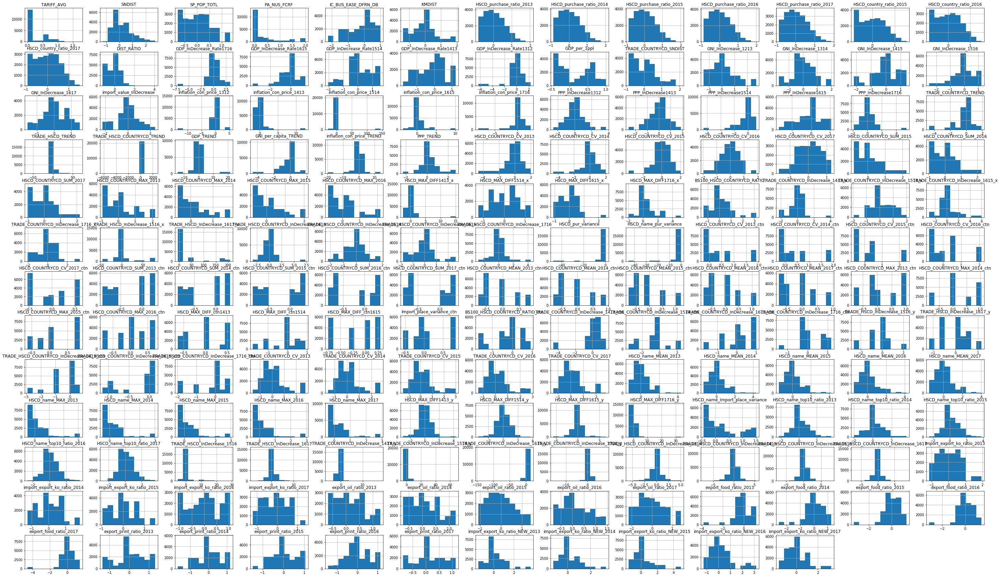

In [101]:
scaled_log_train.iloc[:, :167].hist(figsize=(50, 30))
plt.show()

In [102]:
scaled_log_train.isna().sum().sum()

0

In [103]:
scaled_log_train.to_csv('train_scaled_week4.csv', index=False)
scaled_log_test.to_csv('test_scaled_week4.csv', index=False)

<font color='green'>

### KR_TRADE_HSCD_COUNTRYCD 로그화

 - 예측하고자 하는 y_taregt의 스케일의 격차가 굉장히 큼을 확인할 수 있다.
 - 더 높은 예측력을 위해서 이를 log1p화시켜 분포를 정규분포처럼 만들고 예측하도록 한다.

In [106]:
y_target = pd.read_csv('y_target.csv')

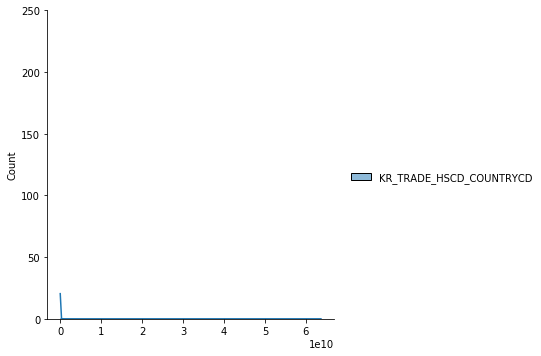

In [156]:
sns.displot(y_target, kde=True)
plt.ylim(0, 250)
plt.show()

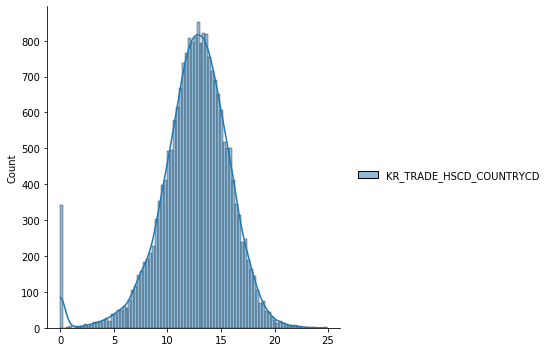

In [157]:
sns.displot(np.log1p(y_target), kde=True)
plt.show()

In [107]:
y_target_log = np.log1p(y_target)
#y_target_log.to_csv('y_target_log.csv', index=False)

<font color='green'>

### Feature Selection

In [108]:
from tqdm import tqdm
import warnings; warnings.filterwarnings('ignore')

# 선형회귀모델
from sklearn.linear_model import Ridge, Lasso, ElasticNet

# 트리회귀모델
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
seed = 42


# 회귀 평가 지표
from sklearn.metrics import mean_squared_error, mean_absolute_error

# CV, Feature Selection
from sklearn.feature_selection import SelectPercentile
from sklearn.model_selection import cross_val_score

In [109]:
train_x = pd.read_csv('train_scaled_week4.csv')
test_x = pd.read_csv('test_scaled_week4.csv')
y_target_log = pd.read_csv('y_target_log.csv').iloc[:, 0]

In [110]:
ridge = Ridge(random_state=seed)
lasso = Lasso(random_state=seed)
elastic = ElasticNet(random_state=seed)
extra_reg = ExtraTreesRegressor(random_state=seed, n_jobs=-1)
rf_reg = RandomForestRegressor(random_state=seed, n_jobs=-1)
gbm_reg = GradientBoostingRegressor(random_state=seed)
xgb_reg = XGBRegressor(random_state=seed, n_jobs=-1)
lgb_reg = LGBMRegressor(random_state=seed, n_jobs=-1)
cat_reg = CatBoostRegressor(random_state=seed, verbose=False)

In [111]:
def get_model_cv_prediction(model, feature_data, y_target):
    neg_mse_scores = cross_val_score(model, feature_data, y_target, scoring='neg_mean_squared_error', cv=5)
    rmse_scores = np.sqrt(-1 * neg_mse_scores)
    avg_rmse = np.mean(rmse_scores)
    print('## ', model.__class__.__name__, ' ##')
    print(f'5 교차검증의 평균 RMSE: {avg_rmse:.3f}')

In [112]:
models = [ridge, lasso, elastic, extra_reg, rf_reg, gbm_reg, xgb_reg, lgb_reg, cat_reg]
for model in models:
    get_model_cv_prediction(model, train_x, y_target_log)

##  Ridge  ##
5 교차검증의 평균 RMSE: 533571514427771.000
##  Lasso  ##
5 교차검증의 평균 RMSE: 4.675
##  ElasticNet  ##
5 교차검증의 평균 RMSE: 5.036
##  ExtraTreesRegressor  ##
5 교차검증의 평균 RMSE: 2.274
##  RandomForestRegressor  ##
5 교차검증의 평균 RMSE: 2.272
##  GradientBoostingRegressor  ##
5 교차검증의 평균 RMSE: 2.264
##  XGBRegressor  ##
5 교차검증의 평균 RMSE: 2.452
##  LGBMRegressor  ##
5 교차검증의 평균 RMSE: 2.276
##  CatBoostRegressor  ##
5 교차검증의 평균 RMSE: 2.286


<font color='green'>

 - 성능이 뛰어남과 동시에 빠르게 성능을 낼 수 있는 LGBMRegressor를 이용하여 Feature Selection 과정을 거치도록 함

100%|██████████████████████████████████████████████████████████████████████████████████| 95/95 [31:08<00:00, 19.67s/it]

(98, 2.2498305577575453)


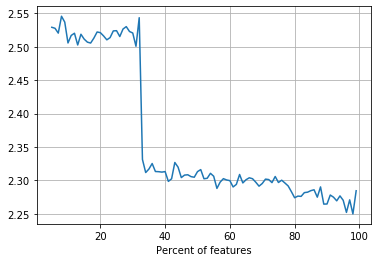

In [113]:
lgb_reg = LGBMRegressor(random_state=seed, n_jobs=-1)
model = lgb_reg    

cv_scores = []
for p in tqdm(range(5,100,1)):
    X_new = SelectPercentile(percentile=p).fit_transform(train_x, y_target_log)    
    cv_score = cross_val_score(model, X_new, y_target_log, scoring='neg_mean_squared_error', cv=5)
    rmse_score_mean = (np.sqrt(-cv_score)).mean()
    cv_scores.append((p, rmse_score_mean))

# Print the best percentile
best_score = cv_scores[np.argmin([score for _, score in cv_scores])]
print(best_score)

# Plot the performance change with p
plt.plot([k for k, _ in cv_scores], [score for _, score in cv_scores])
plt.xlabel('Percent of features')
plt.grid()
plt.show()

In [114]:
# 과적합을 피하기 위해 최적의 p값 주변의 값을 선택하는게 더 나은 결과를 얻을 수 있다. 
selectp = SelectPercentile(percentile=best_score[0]).fit(train_x, y_target_log)
X_train_sel = selectp.transform(train_x)
X_test_sel = selectp.transform(test_x)

In [115]:
pd.DataFrame(X_train_sel).to_csv('train_After_prepro_week4.csv', index=False)
pd.DataFrame(X_test_sel).to_csv('test_After_prepro_week4.csv', index=False)

<font color='green'>
    
선택된 피쳐의 성능을 보도록 한다.

In [116]:
train_features = pd.read_csv('train_after_prepro_week4.csv')
#y_target_log = pd.read_csv('y_target_log.csv')

In [117]:
models = [ridge, lasso, elastic, extra_reg, rf_reg, gbm_reg, xgb_reg, lgb_reg, cat_reg]
for model in models:
    get_model_cv_prediction(model, train_features, y_target_log)

##  Ridge  ##
5 교차검증의 평균 RMSE: 487183442362016.375
##  Lasso  ##
5 교차검증의 평균 RMSE: 10.858
##  ElasticNet  ##
5 교차검증의 평균 RMSE: 15.205
##  ExtraTreesRegressor  ##
5 교차검증의 평균 RMSE: 2.273
##  RandomForestRegressor  ##
5 교차검증의 평균 RMSE: 2.274
##  GradientBoostingRegressor  ##
5 교차검증의 평균 RMSE: 2.260
##  XGBRegressor  ##
5 교차검증의 평균 RMSE: 2.459
##  LGBMRegressor  ##
5 교차검증의 평균 RMSE: 2.256
##  CatBoostRegressor  ##
5 교차검증의 평균 RMSE: 2.299


<font color='green'>

98%퍼센트의 피쳐에서 기본성능이 더 나으므로 98퍼센트의 피처를 가져가도록 한다.

# ────────────────── End of Pipeline2/3 ──────────────────